# Looking at enrollment over time

We have enrollment data from four terms in the form of an excel spreadsheet. Let's take a look at it. First, some standard Python setup. Of note here, pandas, numpy and matplotlib are part of the standard scientific python stack. [mpld3](https://github.com/jakevdp/mpld3) lets us make interactive javascript plots using [D3.js](http://d3js.org/) with essentially zero extra effort.

In [1]:
from __future__ import division
import pandas as pd, numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as patches

%matplotlib inline
import mpld3
from mpld3 import plugins
mpld3.enable_notebook()

## Reading data

pandas makes it easy to read excel spreadsheets. We'll read in one separate object for each of the terms:

In [2]:
f13 = pd.read_excel('Course enrollments - Nate Eastman.xlsx',sheetname='Fall 2013')
s14 = pd.read_excel('Course enrollments - Nate Eastman.xlsx',sheetname='Spring 2014')
f14 = pd.read_excel('Course enrollments - Nate Eastman.xlsx',sheetname='Fall 2014')
s15 = pd.read_excel('Course enrollments - Nate Eastman.xlsx',sheetname='Spring 2015')

## Looking at one term

The main pandas workhorse is called a DataFrame, and the standard pandas convention is to call the thing you're looking at `df`, so let's take a look specifically at fall 2013. Just printing it out shows essentially the same information as was in our spreadsheet. We'll care particularly about three main columns:

 * 'Actual Enrollment': This is the enrollment at the end of the term.
 * 'Census Enrollment1': This is the enrollment two weeks into the course.
 * 'Delta': I added this in the excel sheet, and it's the result of subtracting the above two columns. It tells you how many people the course gained or lost between week 2 and the end of the term. I could have added this column in Python rather than in Excel.

When looking at the below data, one thing should jump out: we see 'NaN' in several places. That means data was missing from the spreadsheet. We'll deal with that below.

In [3]:
df = f13
df

,Course Title,Course Key,Term Code Key,Divs Desc,Subj Desc,Actual Enrollment,Census Enrollment1,Primary Instructor Last Name,Credit Hours,Credit Hours Low,Ptrm Desc,Delta
0,Nicaraguan Political History,11923,Fall 2013,Humanities Division,Spanish,12,0,NaN,2,1,Semester,12
1,(De)constructing Reality,10397,Fall 2013,Humanities Division,Spanish,14,14,Taylor,NaN,3,Semester,0
2,Abstract Algebra A,10263,Fall 2013,Natural Science Division,Mathematics,1,1,Beier,3,3,Semester,0
3,Acting I,10439,Fall 2013,Arts Division,Theatre Arts,11,12,Perkins Socey,4,0,Semester,-1
4,Advanced Analytical Chemistry,12346,Fall 2013,Natural Science Division,Chemistry,11,12,Deibel,NaN,4,Semester,-1
5,Advanced Arabic I,11698,Fall 2013,Humanities Division,Arabic Language,6,7,Tuttle,NaN,3,Semester,-1
6,Advanced Conversation,12556,Fall 2013,Humanities Division,French,12,12,Rose,NaN,3,Semester,0
7,Advanced German,11080,Fall 2013,Humanities Division,German,8,0,NaN,NaN,6,Semester,8
8,Advanced Japanese I,10759,Fall 2013,Humanities Division,Japanese,6,7,Kakutani,4,4,Semester,-1
9,Advanced Physics Laboratory,10304,Fall 2013,Natural Science Division,Physics & Astronomy,2,2,Keister,3,3,Semester,0


### Cleaning the data

So, first things first, let's get rid of the 'NaN' values

In [4]:
df['Credit Hours'].fillna(0,inplace=True)
df['Primary Instructor Last Name'].fillna('Unknown',inplace=True)

Did that get everything? Let's check by printing out all of the rows with missing data:

In [5]:
df[df.isnull().any(axis=1)]

,Course Title,Course Key,Term Code Key,Divs Desc,Subj Desc,Actual Enrollment,Census Enrollment1,Primary Instructor Last Name,Credit Hours,Credit Hours Low,Ptrm Desc,Delta
226,"Is Religion ""T(t)RUE"" ?",11671,Fall 2013,NaN,Religion,10,10,Logan,0,4,Semester,0


OK. Let's fix that one too.

In [6]:
df['Divs Desc'].fillna('Unknown',inplace=True)
df[df.isnull().any(axis=1)]

,Course Title,Course Key,Term Code Key,Divs Desc,Subj Desc,Actual Enrollment,Census Enrollment1,Primary Instructor Last Name,Credit Hours,Credit Hours Low,Ptrm Desc,Delta


Good. Now we have two things to take care of:

 1. First, there are some courses that got split into extra sections. For example, EcoBio started with 2 sections and ended with 4. That does weird things to the numbers, because the original two sections show up as losing a ton of people and the new sections show up as gaining a ton of people. We should really just treat the whole thing (all sections) as one class. We'll do that by grouping everything by course title.

 2. Even after we've done that, some courses show up with 'Census Enrollment1' as 0. My best guess is that these are classes where the instructor did not turn in the census enrollment form, but I don't really know. I *do* know that "starting" with 0 students messes up the numbers, so I'll take only courses where we have more than 0 people to start.
 
While we're at it, let's sort by 'Delta'. In the table below, you'll see the courses with the most drops at the top, and with the most adds at the bottom.

In [7]:
grp = df.groupby('Course Title', as_index=False)

In [8]:
def first(x): 
    return x.min()
agd = grp.aggregate({
        #'Course Title': first,
              'Divs Desc': first,
              'Subj Desc': first,
              'Actual Enrollment': np.sum,
              'Census Enrollment1': np.sum,
              'Primary Instructor Last Name': first,
              'Credit Hours': first,
              'Credit Hours Low': first,
              'Ptrm Desc': first,
              'Delta': np.sum})
df = agd.sort('Delta')
df = df[df['Census Enrollment1'] > 0] # Do this last, so newly added sections get counted

Before we print out the whole table, let's just describe the enrollment changes:

In [9]:
df['Delta'].describe()

count    243.000000
mean      -0.860082
std        1.745411
min       -8.000000
25%       -1.000000
50%        0.000000
75%        0.000000
max        7.000000
Name: Delta, dtype: float64

That's interesting. We have 243 courses total. The average course lost about 1 person, the worst lost 8, and the best gained 7. That seems relatively sane. Many students register for more courses than they plan on taking, so we expect the average course to lose students early on. Well ... maybe. Our "starting" enrollment is counted two weeks into the term, so perhaps this is actually a sign that students truly do enroll for more courses than they can handle. Here's the top and bottom of the table:

In [10]:
df

,Course Title,Credit Hours Low,Delta,Credit Hours,Census Enrollment1,Actual Enrollment,Divs Desc,Ptrm Desc,Subj Desc,Primary Instructor Last Name
159,Intermediate Spanish,4,-8,4,33,25,Humanities Division,Semester,Spanish,Chopite
52,Calculus A,5,-8,0,49,41,Natural Science Division,Semester,Mathematics,Beier
237,Principles of Chemistry,0,-7,4,114,107,Natural Science Division,Semester,Chemistry,Deibel
141,General Physics I,4,-6,4,37,31,Natural Science Division,Semester,Physics & Astronomy,Zilic
54,Care and Feeding of Your iPod,3,-5,3,66,61,Arts Division,Semester,Music Courses,Culverhouse
55,Cell Physiology L and L,0,-5,4,51,46,Natural Science Division,Semester,Biology,Mulnix
65,Computational Science,3,-5,0,19,14,Natural Science Division,Semester,Computer Science,Lerner
245,Race and Ethnicity in the U.S.,4,-5,0,11,6,Social Science Division,Semester,History,Hunter
81,Differential Equations,3,-5,3,14,9,Natural Science Division,Semester,Mathematics,Pardhanani
77,Culture and Conflict,4,-4,0,36,32,Social Science Division,Semester,Sociology/Anthropology,Rosenberg


### Plotting

Now let's visualize the data. I tried a few different ways of looking at it, and you can judge for yourself which (if any) is most informative. 

We're always going to set things up so that hovering over a course tells you more information about it. We set up the labels for the hovertext below, as well as some css for formatting. Then we just reuse it. 

In [11]:
def getlabels(df):
    labels = []
    N = len(df)
    for i in range(N):
        label = """<table border="1" class="dataframe">
      <thead><tr><th>Row {i}</th></tr></thead>
      <tbody>
        <tr><th>Course Title</th>
          <td>{ct}</td>
        </tr>
        <tr><th>Census Enrollment1</th>
          <td>{ce1}</td>
        </tr>
        <tr><th>Actual Enrollment</th>
          <td>{ae}</td>
        </tr>
        <tr><th>Delta</th>
          <td>{delta}</td>
        </tr></tbody></table>
        """.format(i=i,
                   ct=str(df.iloc[i].T['Course Title']),
                   #piln = str(grouped_advertised.iloc[i].T['Primary Instructor Last Name']),
                   #dd = str(grouped_advertised.iloc[i].T['Divs Desc']),
                   #sd = str(grouped_advertised.iloc[i].T['Subj Desc']),
                   ce1 = str(df.iloc[i].T['Census Enrollment1']),
                   ae = str(df.iloc[i].T['Actual Enrollment']),
                   delta = str(df.iloc[i].T['Actual Enrollment'] - df.iloc[i].T['Census Enrollment1']),
                   #piln = str(grouped_advertised.iloc[1].T['Primary Instructor Last Name']),

                  )
        labels.append(label)
    return labels

css = """
table
{
  border-collapse: collapse;
}
th
{
  color: #ffffff;
  background-color: #000000;
}
td
{
  background-color: #cccccc;
}
table, th, td
{
  font-family:Arial, Helvetica, sans-serif;
  border: 1px solid black;
  text-align: right;
}
"""


One straightforward visualization is a scatter plot. The line represents no change, each circle is an actual course. So, courses below the 45-degree line lost students, while courses above that line gained students.

One technical point: there are several overlapping courses (e.g. there might be four courses who started with 10 students and ended with 9). In order to let you see information about each of them, I added a small (less than 0.2 "students") offset in the x and y direction for each point.

You can use the tools at the bottom right to 

 * zoom in (the magnifying glass)
 * drag the view around (the crossed arrows)
 * go back to the original view of the data (the home button)
 
If you've selected one of those, click it again to go back to the mode where you hover to see the course information.

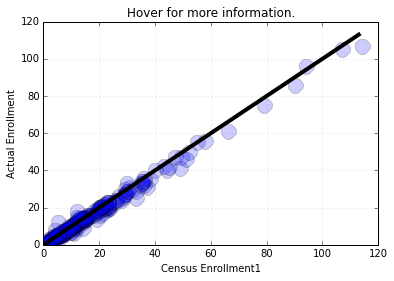

In [12]:
def scatterplot(df):
    fig, ax = plt.subplots()
    ax.grid(True, alpha=0.3)
    axmax = max([df['Census Enrollment1'].abs().max(),df['Actual Enrollment'].abs().max()])
    points = ax.plot(df['Census Enrollment1'] + np.random.rand(len(df))*.2, # add some scatter so we can zoom in.
                     df['Actual Enrollment'] + np.random.rand(len(df))*.2, 
                     'o', 
                     color='b',
                     mec='k', ms=15, mew=1, alpha=.2)
    tooltip = plugins.PointHTMLTooltip(points[0], getlabels(df),
                                       voffset=10, hoffset=10, css=css)
    plugins.connect(fig, tooltip)
    line = ax.plot(range(axmax),range(axmax),'k-',linewidth=4,zorder=10)
    ax.set_xlabel('Census Enrollment1')
    ax.set_ylabel('Actual Enrollment')
    ax.set_title('Hover for more information.')
scatterplot(df)

It can also be nice to use short horizontal lines to represent each course. Here, each arrow represents one course. The starting y-value is the initial enrollment and the ending y-value is the final enrollment. Each arrow has some amount of transparency; courses with larger changes are less transparent.

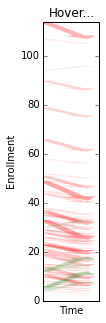

In [13]:
def arrowplot_one(df):
    #print df
    deltamax = df['Delta'].abs().max()
    axmax = max([df['Census Enrollment1'].abs().max(),df['Actual Enrollment'].abs().max()])
    fig = plt.figure(figsize=(1,5))
    ax = plt.gca()
    arrows = []
    for (i,row) in df.iterrows():
        #delta = row['Actual Enrollment']-row['Census Enrollment1']
        delta = row['Delta']
        if delta > 0: 
            fc = 'green'
        else:
            fc = 'red'
        p = patches.Arrow(
            0,#%10, #x
            row['Census Enrollment1'], #y
            0.8, #dx
            delta, #dy
            #width=delta,
            facecolor=fc,
            linewidth=0,
            alpha=abs(delta/23.0),
            )
        arrows.append(ax.add_patch(p))
        #print "ARROWS",arrows
    ax.set_xlim((0,1))
    ax.set_ylim((0,axmax))
    for (arrow,label) in zip(arrows,getlabels(df)):
        tooltip = plugins.PointHTMLTooltip(arrow,[label],css=css)
        plugins.connect(fig,tooltip)

    plt.xticks([])
    ax.set_xlabel('Time')
    ax.set_ylabel('Enrollment')
    ax.set_title('Hover...')

arrowplot_one(df)

Now, that's a lot of information on a single graph. We can split it up into 10 arbitrary groups

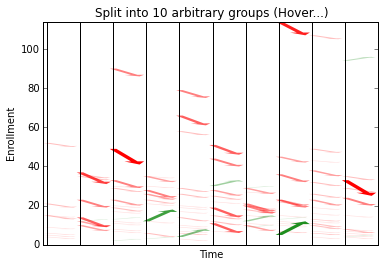

In [14]:
def arrowplot(df):
    fig, ax = plt.subplots()
    deltamax = df['Delta'].abs().max()
    axmax = max([df['Census Enrollment1'].abs().max(),df['Actual Enrollment'].abs().max()])
    arrows = []
    for (i,row) in df.iterrows():
        delta = row['Actual Enrollment']-row['Census Enrollment1']
        if delta > 0: 
            fc = 'green'
        else:
            fc = 'red'
        p = patches.Arrow(
            i%10, #x
            row['Census Enrollment1'], #y
            .8, #dx
            delta, #dy
            #width=delta,
            facecolor=fc,
            linewidth=0,
            alpha=abs(delta/deltamax),
            )
        arrows.append(ax.add_patch(p))
    ax.set_xlim((-0.1,10))
    ax.set_ylim((0,axmax))
    for (arrow,label) in zip(arrows,getlabels(df)):
        tooltip = plugins.PointHTMLTooltip(arrow,[label],css=css)
        plugins.connect(fig,tooltip)
    plt.xticks([])
    plt.vlines(range(10),np.zeros(10),np.ones(10)*120)
    ax.set_xlabel('Time')
    ax.set_ylabel('Enrollment')
    ax.set_title('Split into 10 arbitrary groups (Hover...)')
arrowplot(df)

## The other terms

### Cleaning

In [15]:
def getclean(df):
    df['Credit Hours'].fillna(0,inplace=True)
    df['Primary Instructor Last Name'].fillna('Unknown',inplace=True)
    df['Divs Desc'].fillna('Unknown',inplace=True)
    grp = df.groupby('Course Title', as_index=False)
    agd = grp.aggregate({
        #'Course Title': first,
              'Divs Desc': first,
              'Subj Desc': first,
              'Actual Enrollment': np.sum,
              'Census Enrollment1': np.sum,
              'Primary Instructor Last Name': first,
              'Credit Hours': first,
              'Credit Hours Low': first,
              'Ptrm Desc': first,
              'Delta': np.sum})
    df = agd.sort('Delta')
    df = df[df['Census Enrollment1'] > 0] # Do this last, so newly added sections get counted    
    return df

f13 = getclean(f13)
s14 = getclean(s14)
f14 = getclean(f14)
s15 = getclean(s15)

for (df,desc) in zip((f13,s14,f14,s15),('Fall 2013','Spring 2014','Fall 2014','Spring 2015')):
    print "Working with",desc
    print "Number of NaN rows", len(df[df.isnull().any(axis=1)])
    print df['Delta'].describe()
    print

Working with Fall 2013
Number of NaN rows 0
count    243.000000
mean      -0.860082
std        1.745411
min       -8.000000
25%       -1.000000
50%        0.000000
75%        0.000000
max        7.000000
Name: Delta, dtype: float64

Working with Spring 2014
Number of NaN rows 0
count    264.000000
mean      -0.871212
std        2.282035
min      -23.000000
25%       -1.000000
50%        0.000000
75%        0.000000
max        7.000000
Name: Delta, dtype: float64

Working with Fall 2014
Number of NaN rows 0
count    267.000000
mean      -0.790262
std        2.007743
min      -14.000000
25%       -1.000000
50%        0.000000
75%        0.000000
max       12.000000
Name: Delta, dtype: float64

Working with Spring 2015
Number of NaN rows 0
count    279.000000
mean      -0.992832
std        1.717437
min      -13.000000
25%       -1.500000
50%        0.000000
75%        0.000000
max        2.000000
Name: Delta, dtype: float64



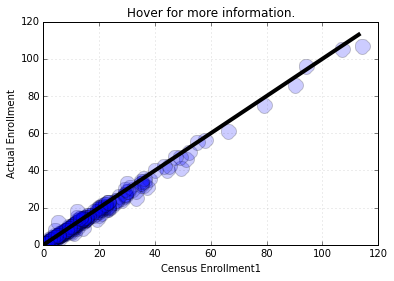

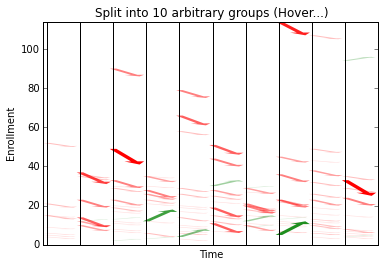

In [16]:
scatterplot(f13)
arrowplot(f13)

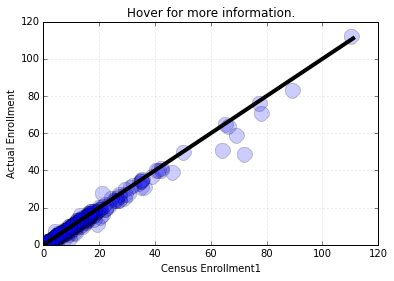

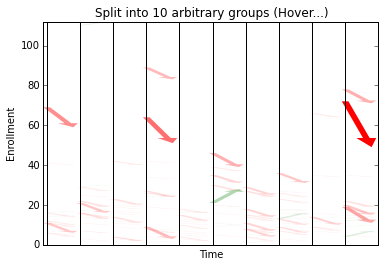

In [17]:
scatterplot(s14)
arrowplot(s14)

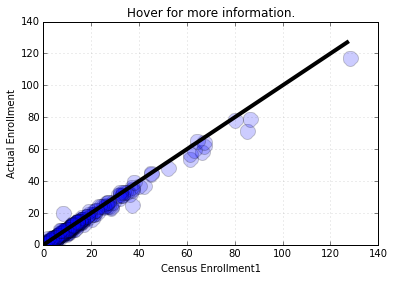

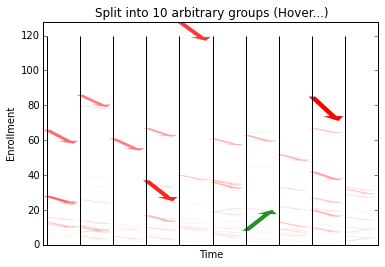

In [18]:
scatterplot(f14)
arrowplot(f14)

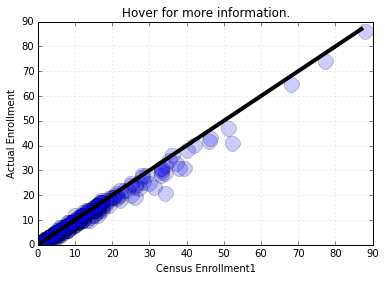

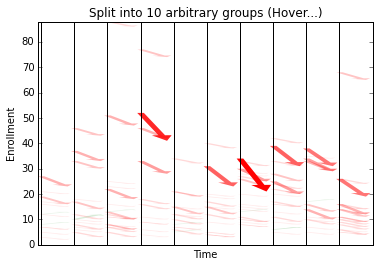

In [19]:
scatterplot(s15)
arrowplot(s15)